In [2]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import gaussian_filter
import skimage as sk
from skimage.io import imread, imshow
from skimage import exposure
from matplotlib.patches import Polygon
import tifffile
from moire_class import FourierAnalyzer 
from tabulate import tabulate
import plot_image_with_scale as scale_plot
import interferometric
from interferometric import DataAnalyzer, Disk, DP, save_DataAnalyzer_object, load_DataAnalyzer_object, InterferometricAnalyzer
from tqdm import tqdm
import h5py
from dask import array
import json
import helper_functions as hf
import py4DSTEM

In [3]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [4]:
# choose the files #
path = '/media/clara/PortableSSD/pnm/master_thesis/interferometric-simulation-data/cropped_4dstem_data_3_15_20231010.hdf5'
img_path = '/media/clara/PortableSSD/pnm/master_thesis/interferometric-simulation-data/maadf_3_15_20231010.tif'

## initialize object

In [5]:
# initialize object #
sim01 = DataAnalyzer(path, energy=60, image_path=img_path, verbose=True)

In [6]:
sim01.real_image = sim01.real_image.transpose()

In [8]:
sim01.image_scale =  8/sim01.real_image.shape[0]
sim01.twist_angle = np.radians(3.15)
sim01.diks_mask = 7

## pre-processing

In [9]:
# calculate the dp mean #
sim01.calculate_mean()

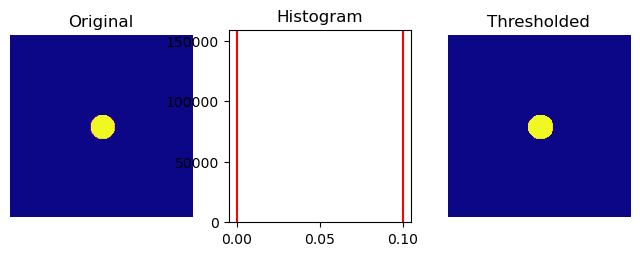

In [10]:
sim01.disk_r, sim01.center = sim01.get_convergence_angle(threshold=(1e-6, 1e-1), gaussian=0);

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 160.56it/s]


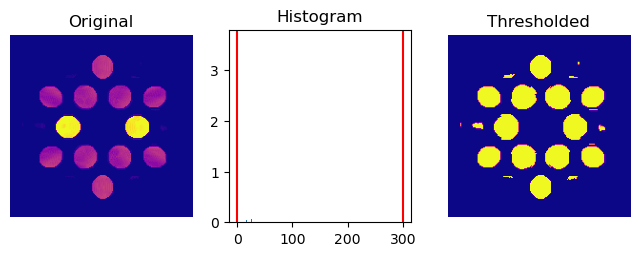

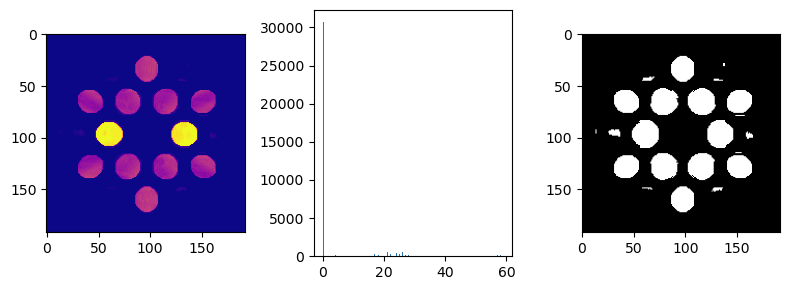

In [11]:
summed, bin_image = sim01.create_binary_image_from_stack(line=1, first_thresholds=(1e-7,7e-7), second_thresholds=(0,300), gaussian=None, mask_radius=15)

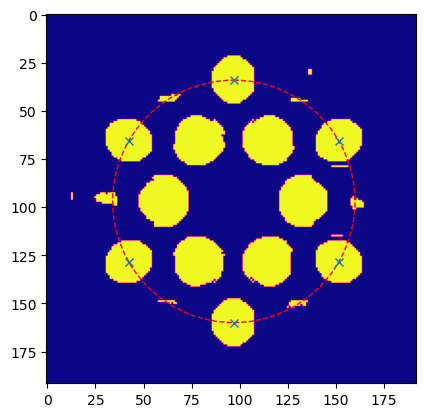

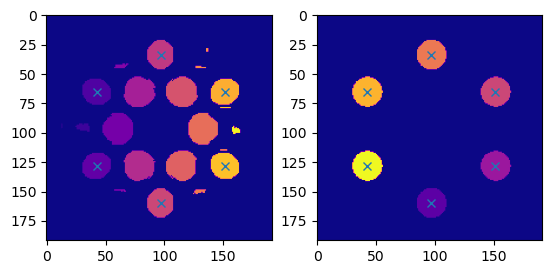

In [12]:
sim01.get_label_image(bin_image, min_area=90, square_px=1)

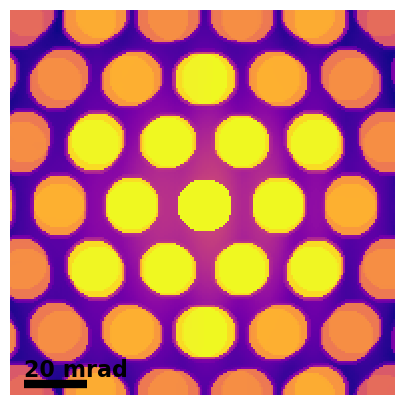

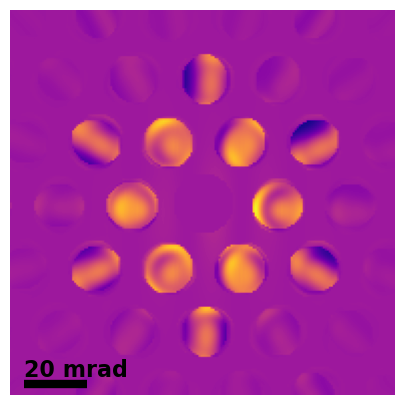

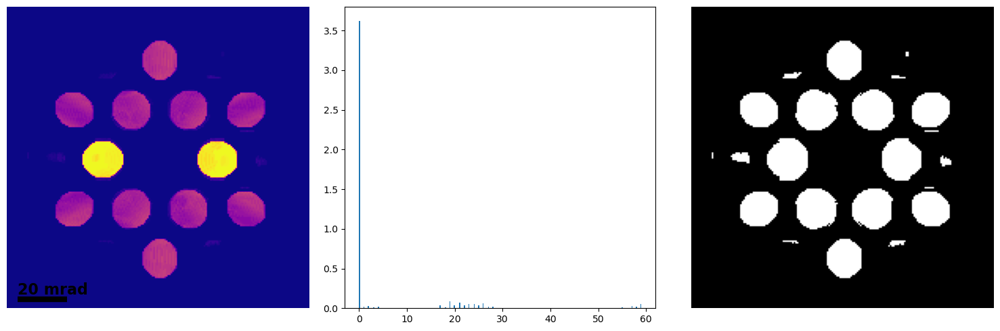

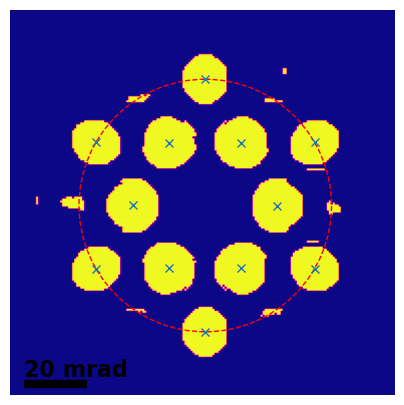

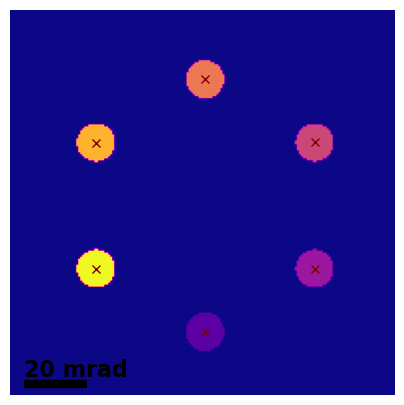

In [428]:
sim01.visualize_all(mask_radius=15, gaussian=0, save='simulation_files/sim01-final/pre-processing')

## reconstruct ADF

In [136]:
sim01.reconstruct_adf('maadf') 

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3481/3481 [00:20<00:00, 173.15it/s]


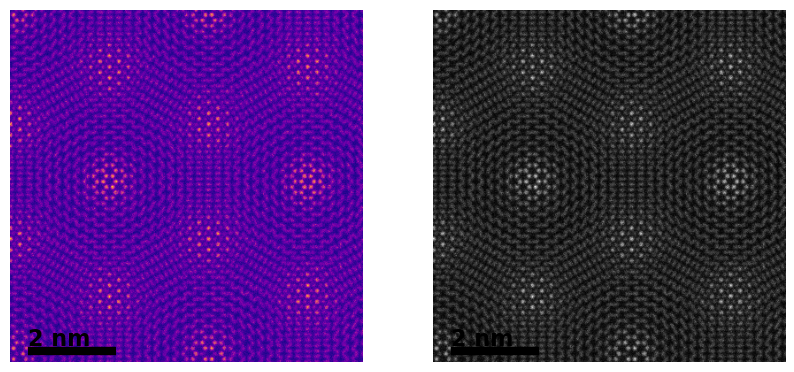

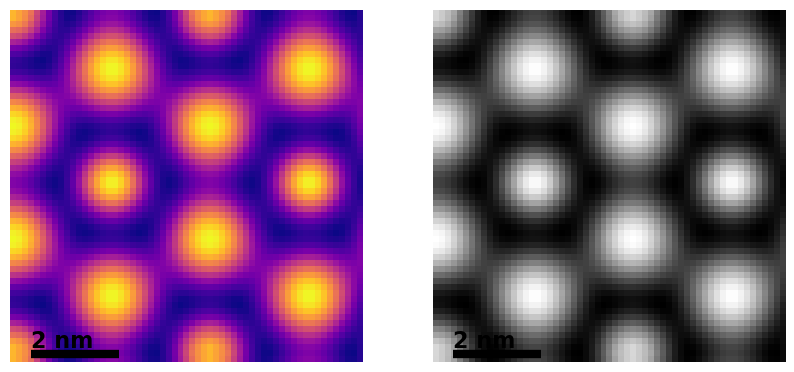

In [419]:
sim01.show_images(gaussian=0, save='simulation_files/sim01-final/pre-processing')

## binning of the diffraction map ##

In [18]:
sim01.bin_data(bin_size=(2,2))

## define starting values for fit

In [20]:
ps = []

## define initial parameters for disk 0##

A = 1e-7
phi = 2
nu = .05

dir_ang = np.radians(-45)

p0_0 = (A, phi, nu, dir_ang)

ps.append(p0_0)

## define initial parameters for disk 1 ##

A = 1e-7
phi = .5
nu = .05

dir_ang = np.radians(45)

p0_1 = (A, phi, nu, dir_ang)

ps.append(p0_1)

## define initial parameters for disk 2 ##

A = 1e-7
phi = 5
nu = .08
dir_ang = np.radians(90)

p0_2 = (A, phi, nu, dir_ang)

ps.append(p0_2)


## example fit of some position

In [44]:
sim01.disk_mask = 6
sim01.verbose=False

====== disk 0 ======
r² = 0.937


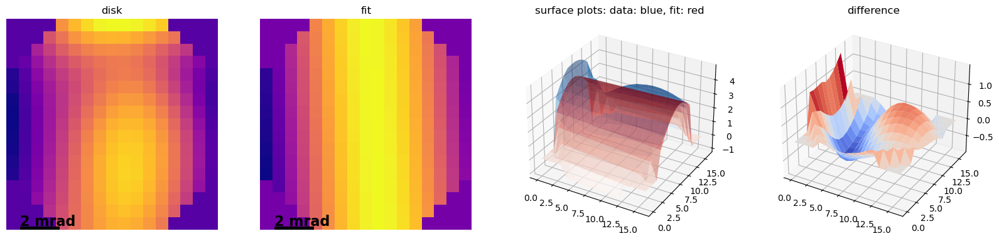

====== disk 1 ======
r² = 0.9761


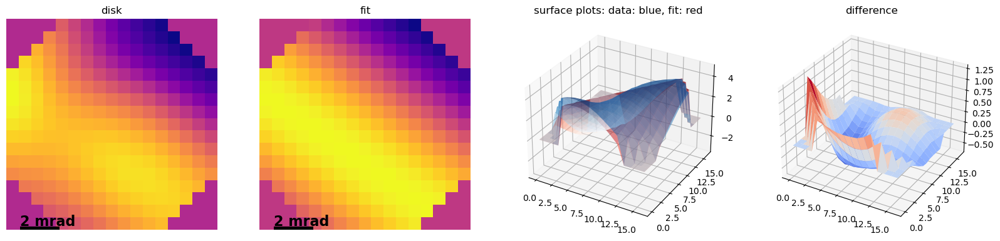

====== disk 2 ======
r² = 0.9965


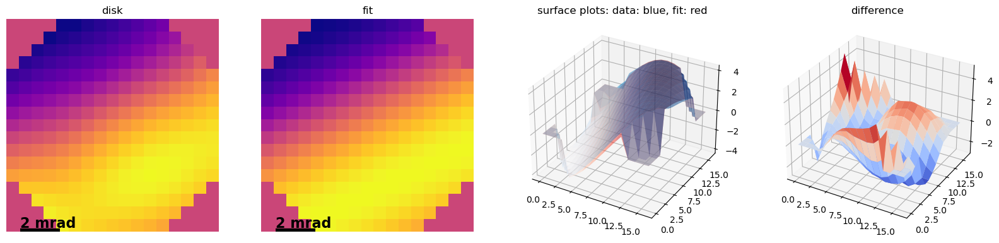

====== disk 3 ======
r² = 0.9955


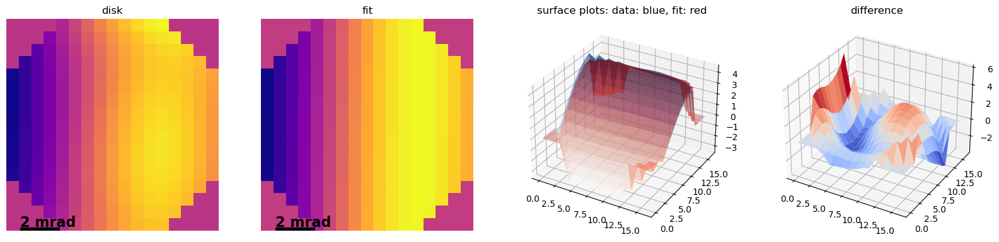

====== disk 4 ======
r² = 0.9696


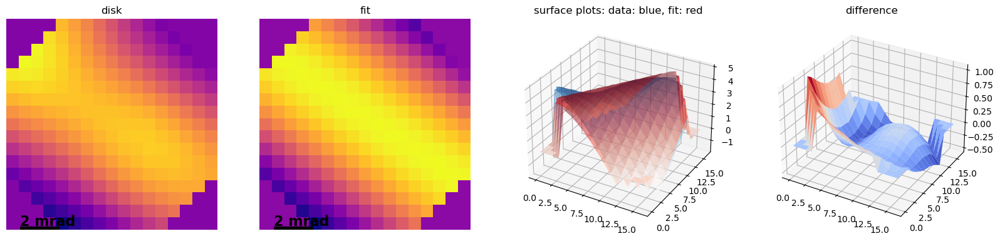

====== disk 5 ======
r² = 0.9757


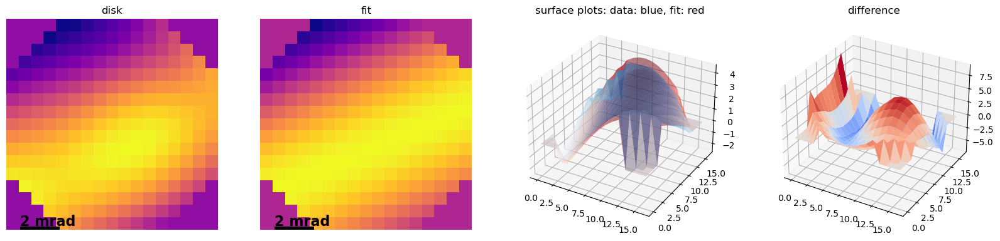

In [45]:
dp = sim01.fit_position([1,1], ps, gaussian=0, rotate_avrg=False, binning=False, avrg=False)#, save='simulation_files/sim01-final/fits')

In [46]:
dp.get_stats()#save='simulation_files/sim01-final/fits/example11_no _bin')

disk 0

A : 3.9266082173702336e-07
phi : -1.7515858858756972
nu : -0.03342884164114566
dir_angle : -1.5242907457112922
wl : -0.018892144119383652 rad
r_squared : 0.9369675854736701
dir_error : 0.010878038768167538


disk 1

A : 4.2937204814608936e-07
phi : -7.326657467425719
nu : -0.03478253706478747
dir_angle : 2.540871902568115
wl : -0.018156884095379206 rad
r_squared : 0.9760652002512435
dir_error : 0.0075857680750050374


disk 2

A : 4.0763055318472804e-07
phi : 2.8194430241653565
nu : 0.035240790061375656
dir_angle : 0.4352080416815846
wl : 0.01792078137092493 rad
r_squared : 0.9965363646667693
dir_error : 0.0031615500461699407


disk 3

A : 3.890611067391857e-07
phi : 2.6238333984701296
nu : 0.03404662340751364
dir_angle : -1.5876263943863693
wl : 0.018549342954497044 rad
r_squared : 0.9955186105224132
dir_error : 0.0035420385323241222


disk 4

A : 4.23701829484079e-07
phi : 18.50377083408636
nu : -0.03359195807894492
dir_angle : 2.548659167624967
wl : -0.018800407304164306 rad


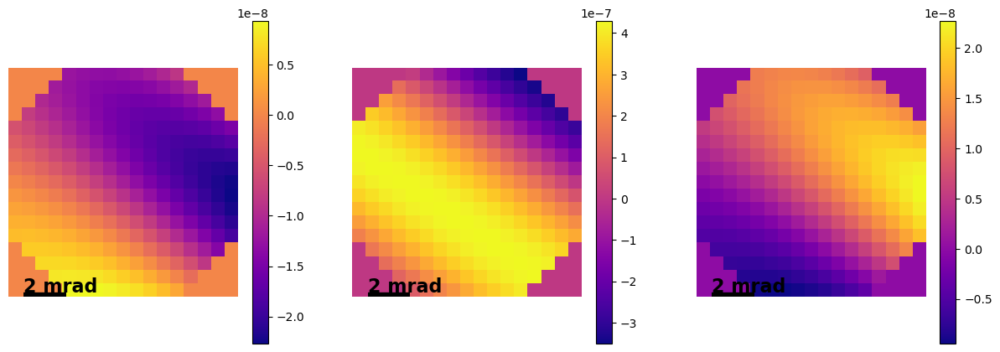

In [59]:

fig, axs = hf.make_scalebar(dp.disks[0].data, sim01.scale, (1,3,(1,2,3)), unit='mrad')

for i, d in enumerate([dp.disks[1]]):

    p0_min = list(np.array(d.p0) - np.array(d.errors))
    p0_max = list(np.array(d.p0) + np.array(d.errors))
    im_min = d.generate_image(p0_min)
    im_max = d.generate_image(p0_max)
    im = d.generate_image(d.p0)
    
    a0 = axs[0].imshow((im_min.reshape(d.shape)-im.reshape(d.shape)).transpose(), cmap='plasma')
    a1 = axs[1].imshow(im.reshape(d.shape).transpose(), cmap='plasma')
    a2 = axs[2].imshow((im_max.reshape(d.shape)-im.reshape(d.shape)).transpose(), cmap='plasma')
    
    plt.colorbar(a0)
    plt.colorbar(a1)
    plt.colorbar(a2)

hi


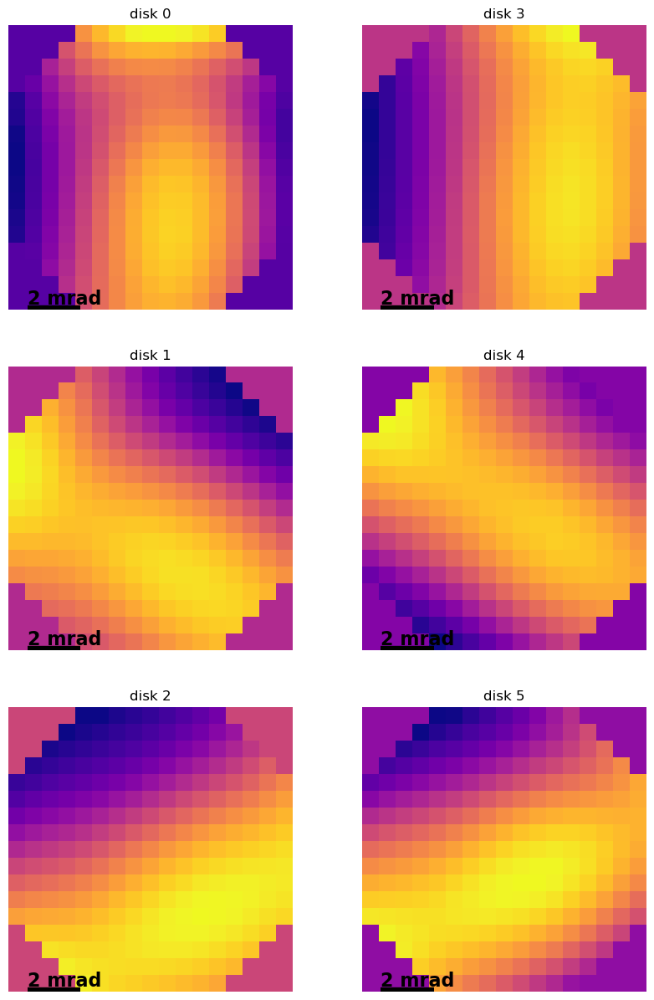

In [150]:
dp.verbose=True
dp.prepare_disks(save='simulation_files/sim01-final/pre-processing')

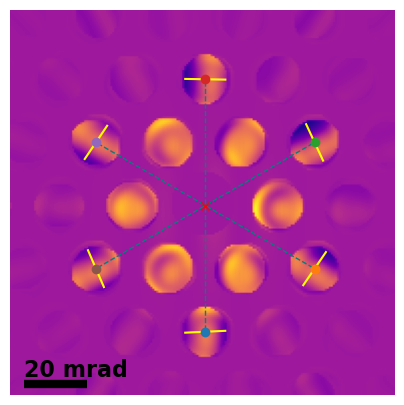

In [151]:
centers = hf.hexagon(sim01.orientation, sim01.r_outer, sim01.center)

fig, axs = hf.make_scalebar(dp.dp, sim01.scale, (1,1,1), unit='mrad')

axs.imshow(hf.mask(dp.dp, 16).transpose(), cmap='plasma')

orientation = sim01.orientation

vectors = [-np.array([np.sin(orientation+i*np.pi/3), np.cos(orientation+i*np.pi/3)]) for i in range(6)]

for i, d in enumerate(dp.disks):
    axs.plot([centers[i][0]-d.n[0]*10, centers[i][0]+d.n[0]*10], [centers[i][1]-d.n[1]*10, centers[i][1]+d.n[1]*10], '-', label=f'{i}', color='yellow')
    axs.plot([sim01.center[0]-vectors[i][0]*62, sim01.center[0]+vectors[i][0]*0], [sim01.center[1]-vectors[i][1]*62, sim01.center[1]+vectors[i][1]*0], '--', lw='1', label=f'{i}', color='teal')
    axs.plot(centers[i][0], centers[i][1], 'o', label=f'{i}')
axs.plot(sim01.center[0], sim01.center[1], 'rx')



plt.savefig('simulation_files/sim01-final/pre-processing/angles.pdf',  bbox_inches='tight', pad_inches=0)


#plt.legend()
#dp.disks[0].n

In [81]:
sim01.binned_data.shape

(58, 58, 192, 192)

## data analysis map

In [152]:
sim01.verbose = False

In [153]:
sim01.disk_mask = 6

In [154]:
defocus_array, defocus_mean, \
    ild_array, ild_mean, rotation_array, \
    A_array, phi_array, lambda_array = sim01.analyze_map(ps, 'simulation_files/sim01-final/analysis/', gaussian=0, rotate_avrg=False, binning=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3364/3364 [14:24<00:00,  3.89it/s]


In [13]:
savedir = 'simulation_files/sim01-final/analysis/'
savefile = 'simulation_files/sim01-final/analysis/fitting_parameters.txt'

d_arrays = []
ild_arrays = []
ild_stds = []
rot_arrays = []
A_arrays = []
phi_arrays = []
lambda_arrays = []

slices = [slice(0,1), slice(1,2), slice(2,3), slice(3,4), slice(4,5), slice(5,6), slice(0,6)]

for i, s in enumerate(slices):
    d_array, d_mean, ild_array, ild_std, ild_mean, rot_array, A_array, phi_array, lam_array = sim01.get_fitted_maps(savefile, 
                                                                                                                    save=savedir, 
                                                                                                                    diskslice=s)
    d_arrays.append(d_array)
    ild_arrays.append(ild_array)
    ild_stds.append(ild_std)
    rot_arrays.append(rot_array)
    A_arrays.append(A_array)
    phi_arrays.append(phi_array)
    lambda_arrays.append(lam_array)
    


In [14]:
def get_array_plots(array, scale, typ, name, unit, shape=(58,58), save=False):
    
    title = typ + ' ' + name
    
    mask = np.where(array>0)
    mean = np.mean([array[i] for i in mask])
    std = np.std([array[i] for i in mask])
    s = f'mean: {float(f"{mean:.4g}"):g}\nstd: {float(f"{std:.4g}"):g}'
    
    fig, axs = hf.make_scalebar(array.reshape(shape), scale, (1,2,2), unit='nm')
    im = axs[1].imshow(array.reshape(shape).transpose(), cmap='plasma')
    cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=12)
    #cbar.get_offset_text().set_fontsize(11)
    
    axs[0].hist(array, 35, density=True, color='teal', edgecolor='navy')
    axs[0].text(0.7, 0.9, s, horizontalalignment='left',verticalalignment='center', transform=axs[0].transAxes)

    
    axs[0].tick_params(labelsize=15)
    axs[0].yaxis.get_offset_text().set_fontsize(13)
    axs[0].xaxis.get_offset_text().set_fontsize(13)
    
    axs[0].set_xlabel(typ + f' ({unit})', fontsize=13)
    
    plt.suptitle(title)
    
    plt.tight_layout()
    
    if save:
        plt.savefig(save,  bbox_inches='tight', pad_inches=0)

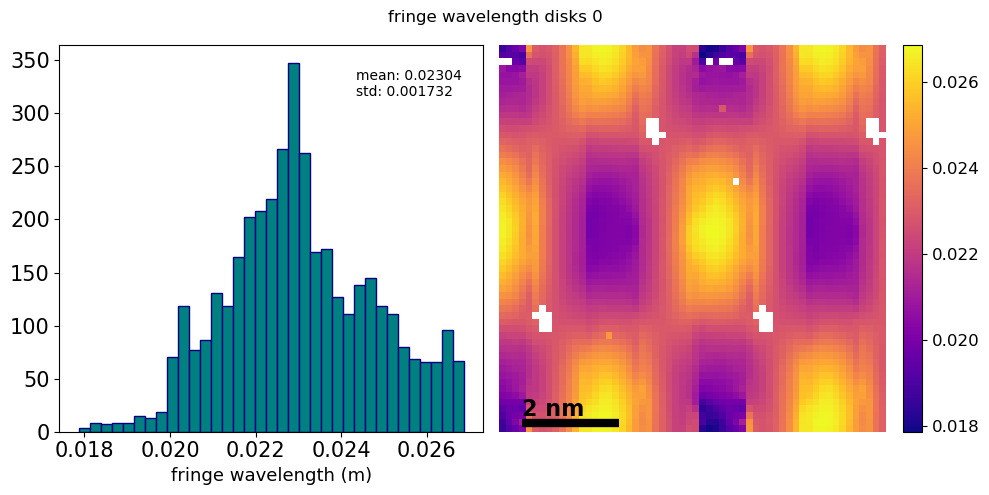

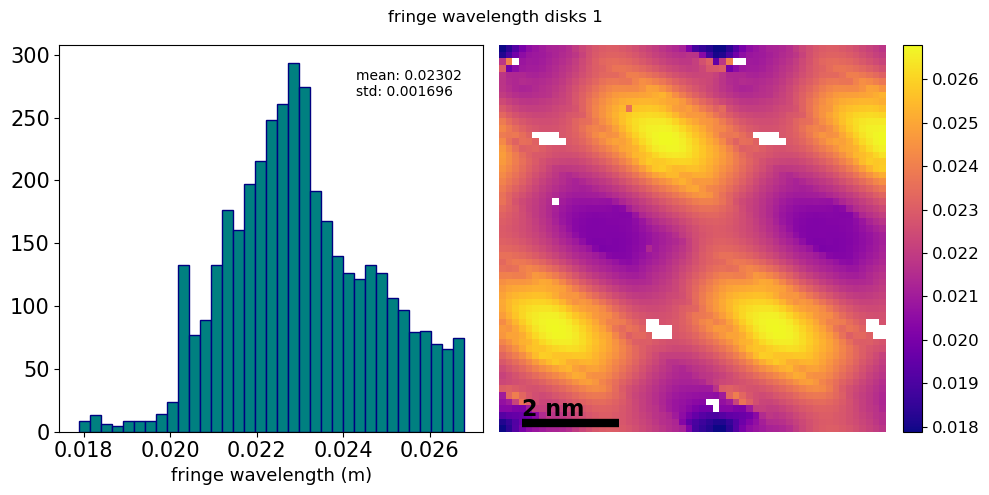

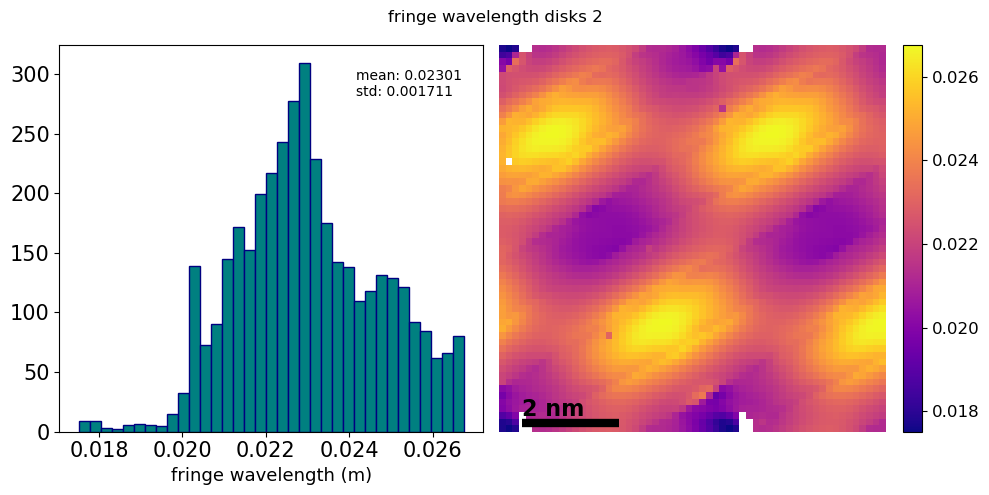

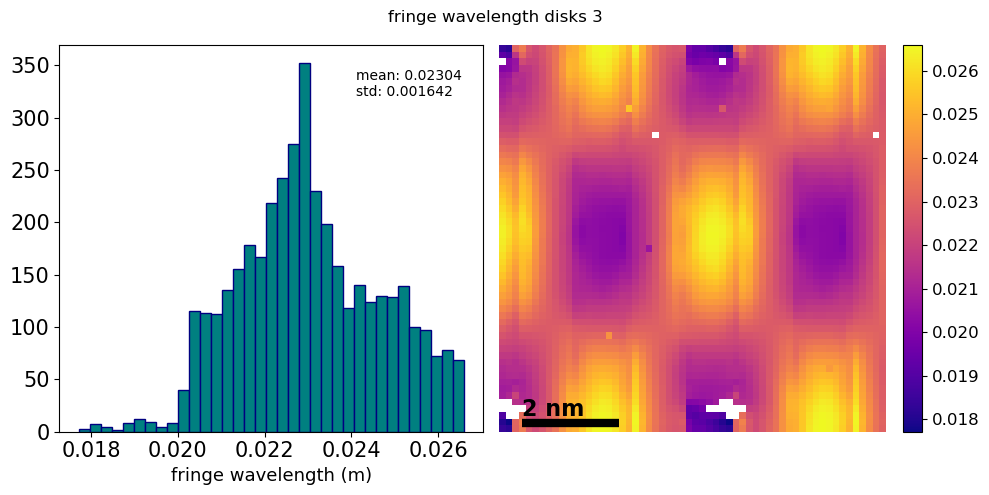

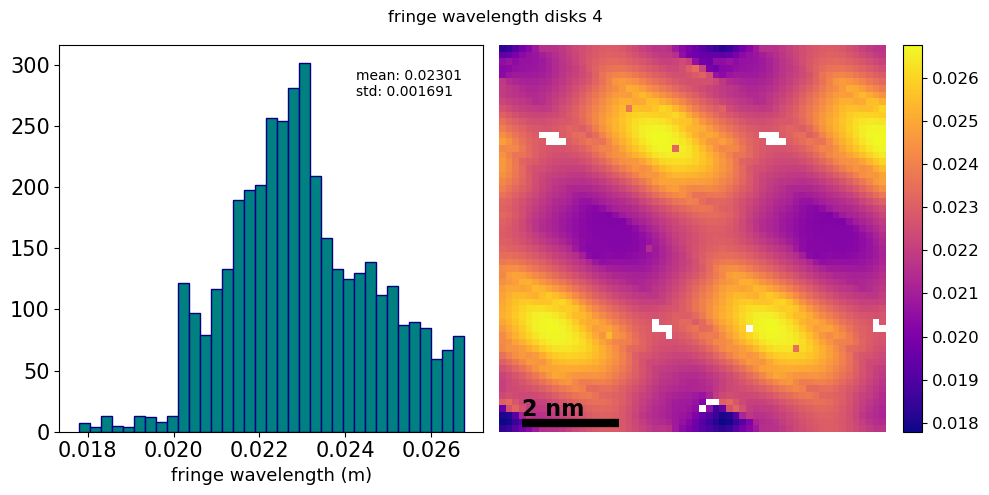

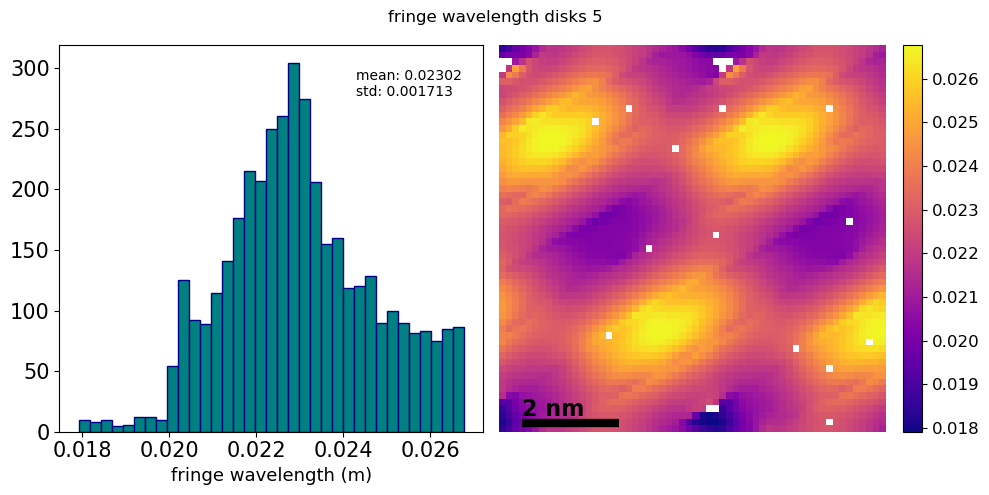

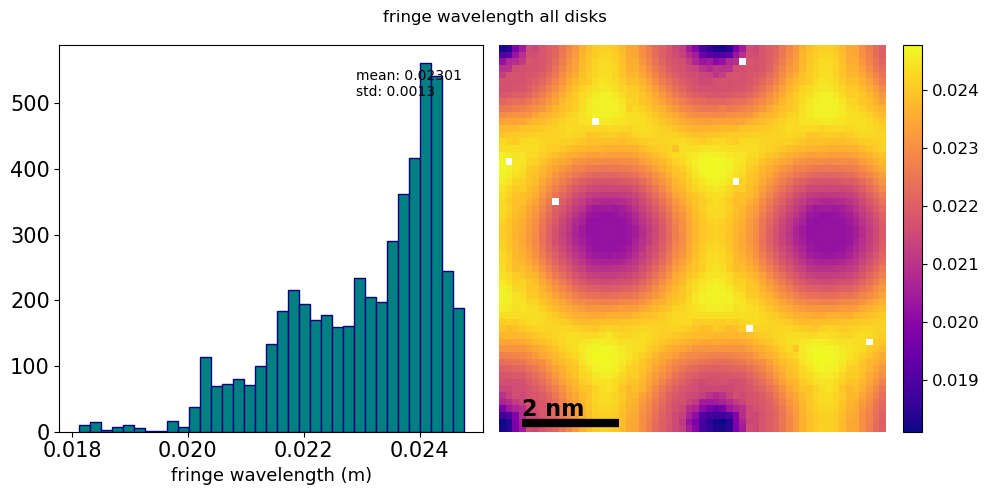

In [15]:
types = ['defocus', 'interlayer distance', 'interlayer distance standard deviation', 'fringe rotation', 'amplitude', 'phase shift', 'fringe wavelength']
names = [f'disks {i}' for i in range(6)] + ['all disks']
units = ['m', 'm', 'm', 'degrees', 'intensity', 'rad', 'rad']

arrays = [d_arrays, ild_arrays, ild_stds, [np.degrees(r) for r in rot_arrays], A_arrays, phi_arrays, lambda_arrays]

path = 'simulation_files/sim01-final/analysis/array_plots/'

for i, typ in enumerate([types[-1]]):
    this_arrays = arrays[-1]
    
    for j, array in enumerate(this_arrays):
        save = path+f"{typ.replace(' ', '-')}_{names[j].replace(' ', '-')}_plot.pdf"
        get_array_plots(array.ravel(), sim01.image_scale/(58/len(sim01.real_image)), typ=typ, name=names[j], unit=units[i], save=save)
        
        

## get binned virtual image 

In [287]:
sim01.reconstruct_adf('maadf', binning=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3364/3364 [00:00<00:00, 14375.79it/s]


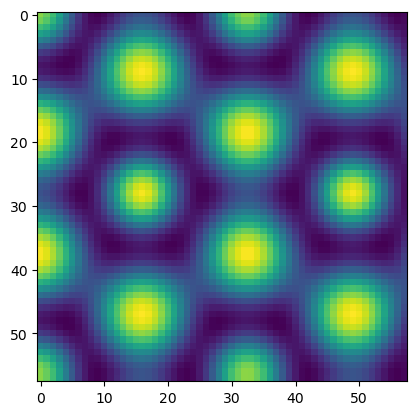

In [289]:
plt.imshow(sim01.virtual_image_binned.data.transpose())

## Analyse AA and AB regions

### AA

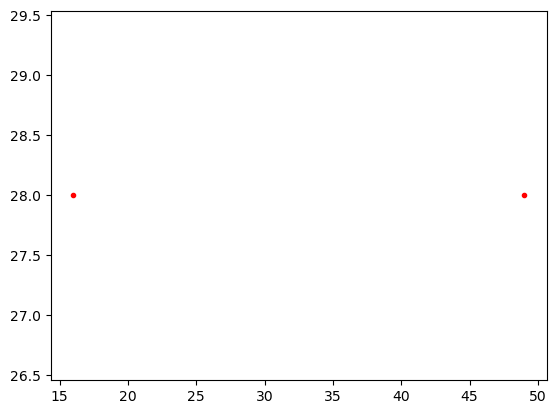

In [25]:
AA_spots_1 = [[16,28]]#, [17,28], [16,29], [17,29]] 
AA_spots_2 = [[49,28]]#, [50,28], [49,29], [50,29]] 

AA_spots = AA_spots_1 + AA_spots_2

plt.imshow(sim01.virtual_image_binned.data.transpose())
for s in AA_spots:
    plt.plot(s[0], s[1], 'r.')


In [94]:
def fit_and_mean(centers, save=False):
    shape = sim01.binned_data.shape[:2]
    relation = shape[0]/sim01.real_image.shape[0]
    
    #fig, axs = hf.make_scalebar(sim01.virtual_image_binned.data, sim01.image_scale/relation, (1,1,1), unit='nm')
    #axs.imshow((sim01.virtual_image_binned.data).transpose(), cmap='plasma')
    #for c in centers:
        #axs.plot(c[0], c[1], '.', color='red')
    
   # plt.tight_layout()
    
    if save:
        path = save + 'used_regions.pdf'
        plt.savefig(path,  bbox_inches='tight', pad_inches=0)
     
    fig, axs = hf.make_scalebar(sim01.dp_mean, sim01.scale, (len(centers),1,tuple([1+i for i in range(len(centers))])), unit='mrad')
    for i, c in enumerate(centers):
        axs[i].imshow(hf.mask((sim01.binned_data[c[0], c[1], :,:]-sim01.dp_mean).transpose(),16), cmap='plasma')
    
    if save:
        path = save + 'pd_patterns.pdf'
        plt.savefig(path,  bbox_inches='tight', pad_inches=0)
    
    all_defocus = []
    all_ild = []
    all_rotation = []
    all_rot_errors = []
    all_nu = []
    all_nu_errors = []
    
    for i, c in enumerate(centers):
    #sim01.analyze_map(ps, savedir='simulation_files/sim01-final/analysis/AA_regions/', gaussian=0, positions=centers, binning=True)
        dp = sim01.fit_position(c, ps, gaussian=0, rotate_avrg=False, binning=True, avrg=False, silent=True)
        defocus_list, ild_list, rotation_list, defocus, ild, rot_error_list, nu_list, nu_error_list = sim01.analyze_disks(dp.disks)  
        all_defocus.append(defocus_list)
        all_ild.append(ild_list)
        all_rotation.append(rotation_list)
        all_rot_errors.append(rot_error_list)
        all_nu.append(nu_list)
        all_nu_errors.append(nu_error_list)
        
    mean_ild = np.mean(np.array(all_ild).flatten())
    std_ild = np.std(np.array(all_ild).flatten())
    mean_def = np.mean(np.array(all_defocus).flatten())
    std_def = np.std(np.array(all_defocus).flatten())
    
    print(all_rot_errors)
    print(all_nu_errors)
    print(all_ild)
    
    mean_nu = np.mean(np.array(all_nu).flatten())
    
    all_ild_errors = []
    for i, c in enumerate(centers):
        error_ild = [ia.get_ild_error(all_rotation[i][j], all_nu[i][j], all_rot_errors[i][j], all_nu_errors[i][j]) for j in range(len(all_nu))]
        all_ild_errors.append(error_ild)
    
    arrays = [all_defocus, all_ild, np.degrees(all_rotation), all_ild_errors]
    savenames = ['defocus', 'ild', 'rotation', 'error ild']
    
    headers = [f'disk {i}' for i in range(6)]
    rowIDs = [f'position {i}' for i in range(len(centers))]
    
    for i, a in enumerate(arrays):
        print(tabulate(a, headers=headers, showindex=rowIDs, tablefmt='simple'))
        
        if save:
            path = save + savenames[i] + '_table.txt'
            s = tabulate(np.array(a), headers=headers, showindex=rowIDs, tablefmt='latex')
            with open(path, 'w') as f:
                f.write(s)
    
    
    return all_defocus, all_ild, all_rotation, all_errors, mean_ild, std_ild, mean_def, std_def, mean_nu, all_ild_errors

In [95]:
ia = InterferometricAnalyzer(sim01)

<Figure size 640x480 with 0 Axes>

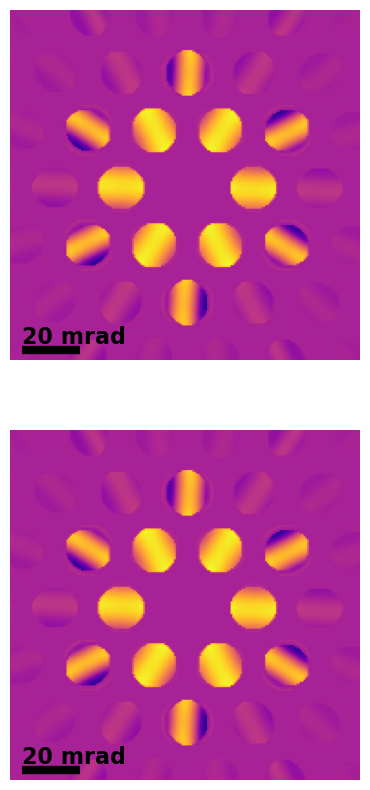

[[0.0019209285780428013, 0.0016771986667166847, 0.0016252777226525219, 0.0016916172011778403, 0.001763607261212969, 0.0017524397302203713], [0.0019209285780428013, 0.001677198598535828, 0.0016252772009392963, 0.0016916171393680797, 0.001763607261212969, 0.0017524391220041455]]
[[4.783250421459961e-05, 4.257858474567026e-05, 4.328466906746831e-05, 4.549505756973063e-05, 4.203091065385758e-05, 4.0998040219483095e-05], [4.783250421459961e-05, 4.257858500085922e-05, 4.328468198420775e-05, 4.549505656991659e-05, 4.203091065385758e-05, 4.099804682652629e-05]]
[[3.3994689544143633e-10, 3.4437278733735456e-10, 3.0441112041373875e-10, 3.254519463116523e-10, 3.275897575395014e-10, 3.0552487855057517e-10], [3.3994689544143633e-10, 3.4437287069518227e-10, 3.044112825193962e-10, 3.254521023617405e-10, 3.275897575395014e-10, 3.0552393344009184e-10]]
                 disk 0       disk 1       disk 2       disk 3       disk 4       disk 5
----------  -----------  -----------  -----------  ----------- 

NameError: name 'all_errors' is not defined

In [96]:
all_defocus, all_ild, all_rotation, all_errors, mean_ild, std_ild, mean_def, std_def, mean_nu, all_ild_errors = fit_and_mean(AA_spots,save='simulation_files/sim01-final/analysis/AA_regions/')

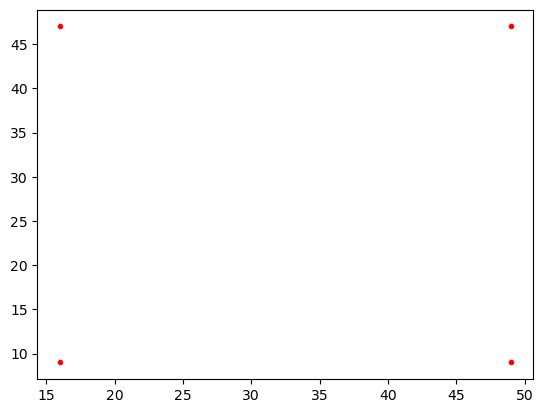

In [24]:
AB_spots_1 = [[16,47]]#, [17,47], [16,48], [17,48]] 
AB_spots_2 = [[49,47]]#, [50,47], [49,48], [50,48]] 
AB_spots_3 = [[16,9]]#, [17,9], [16,10], [17,10]] 
AB_spots_4 = [[49,9]]#, [50,9], [49,10], [50,10]]
#AB_spots_5 = [[32,37]]
#AB_spots_6 = [[32,18]] #[[32,37], [33,37], [32,38], [33,38]]

AB_spots = AB_spots_1 + AB_spots_2 + AB_spots_3 + AB_spots_4 #+ AB_spots_5 + AB_spots_6

#plt.imshow(sim01.virtual_image_binned.data.transpose())
for s in AB_spots:
    plt.plot(s[0], s[1], 'r.')

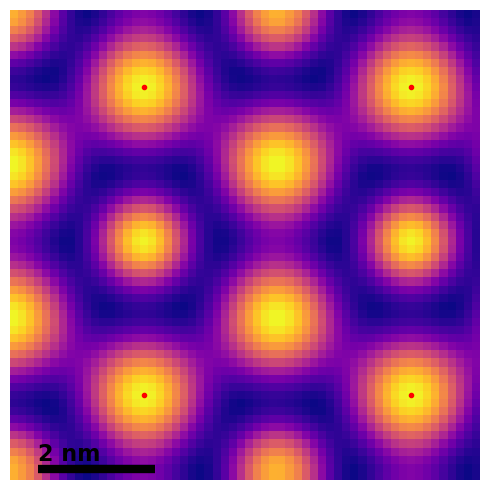

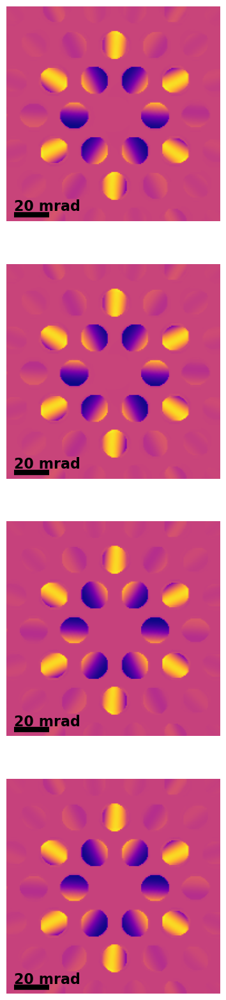

====== disk 0 ======
r² = 0.9978


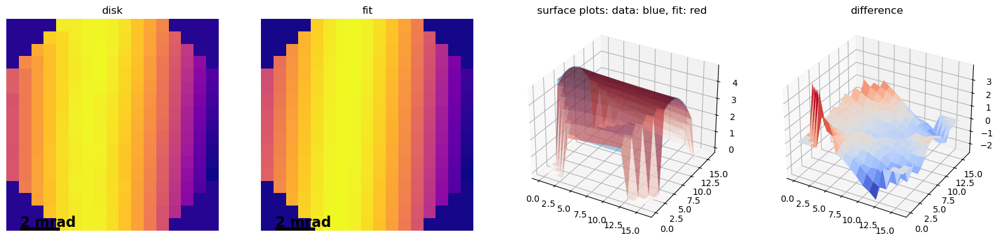

====== disk 1 ======
r² = 0.9989


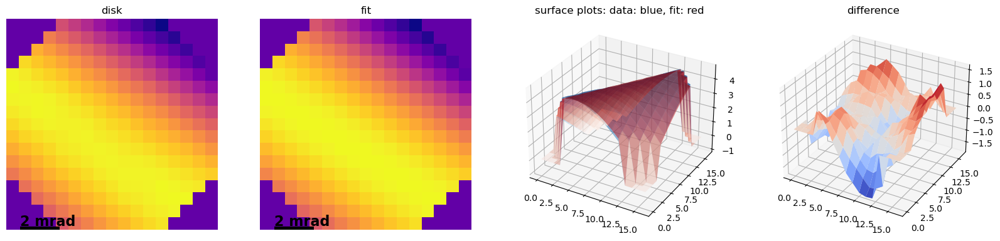

====== disk 2 ======
r² = 0.9993


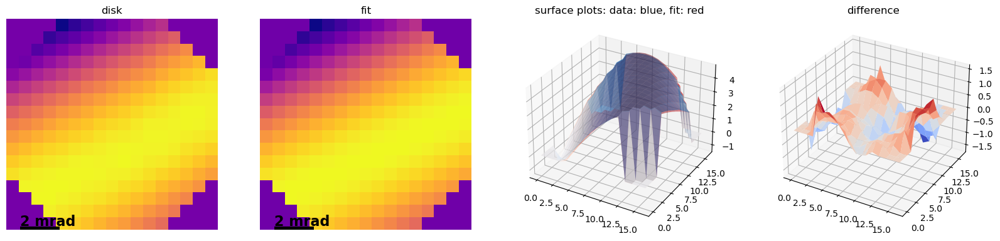

====== disk 3 ======
r² = 0.9988


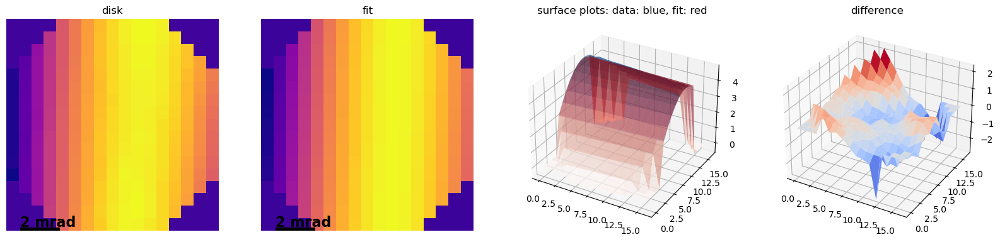

====== disk 4 ======
r² = 0.9989


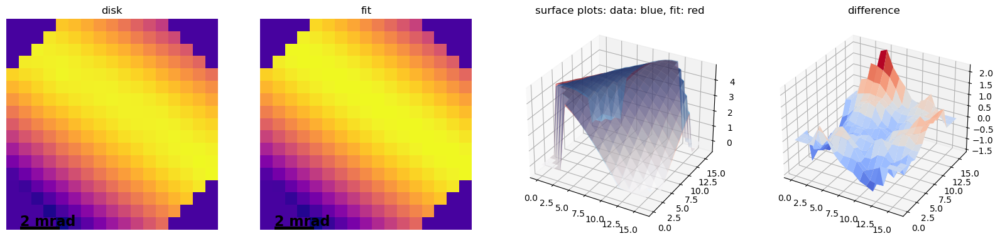

====== disk 5 ======
r² = 0.9984


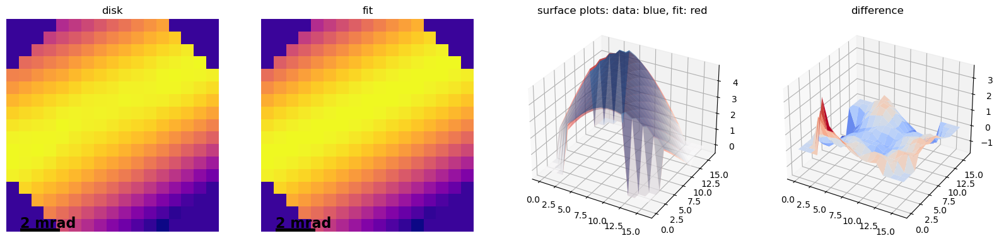

====== disk 0 ======
r² = 0.9978


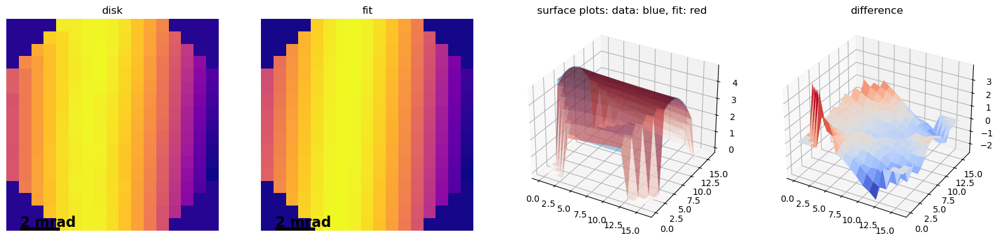

====== disk 1 ======
r² = 0.9989


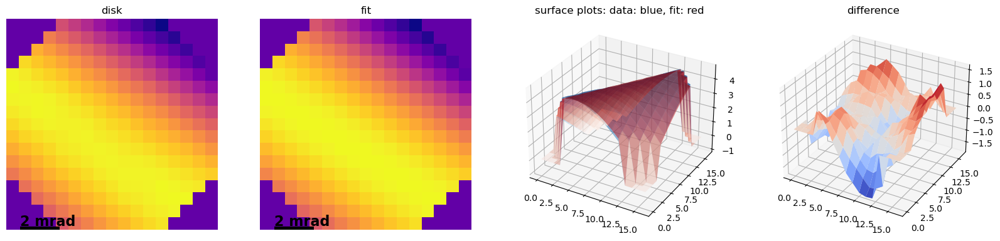

====== disk 2 ======
r² = 0.9993


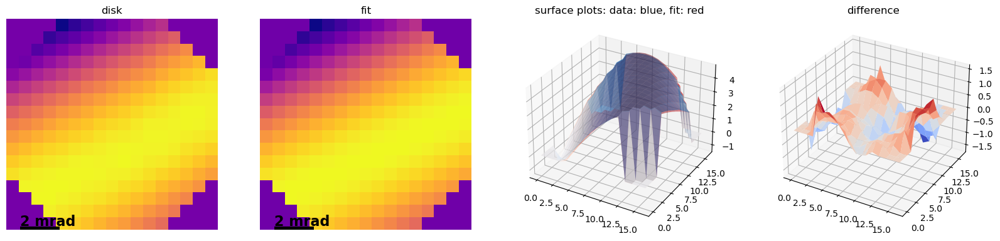

====== disk 3 ======
r² = 0.9988


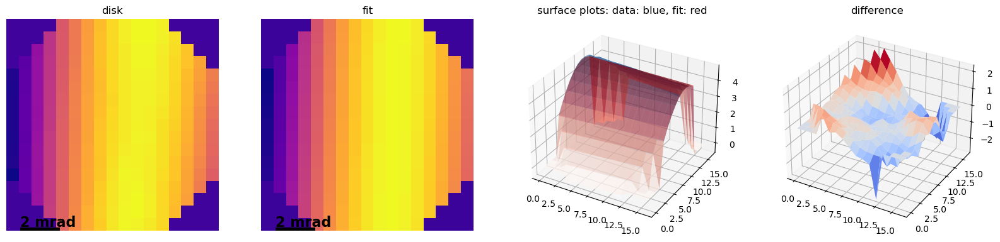

====== disk 4 ======
r² = 0.9989


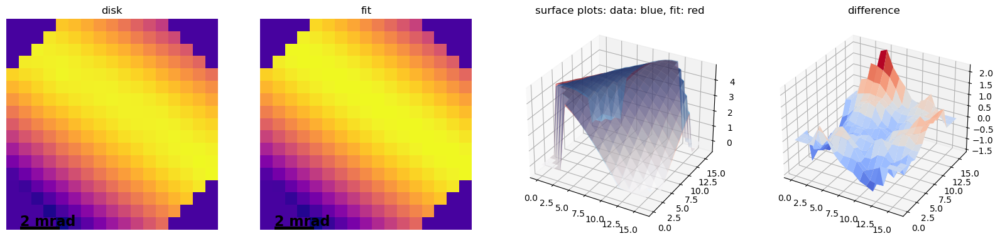

====== disk 5 ======
r² = 0.9984


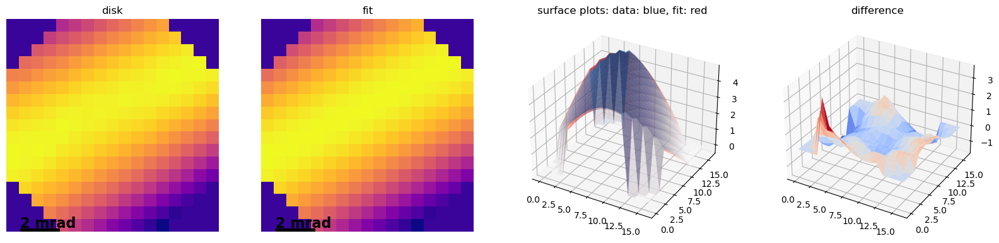

====== disk 0 ======
r² = 0.9976


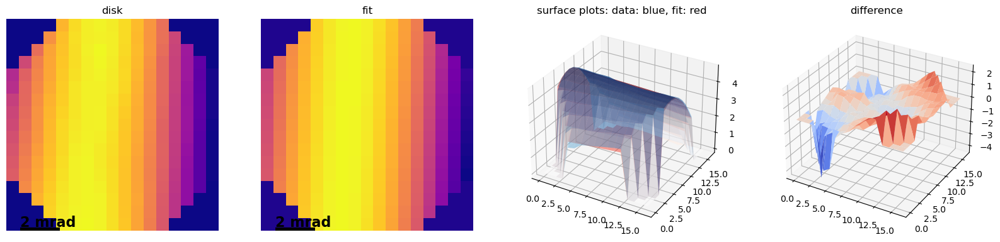

====== disk 1 ======
r² = 0.9991


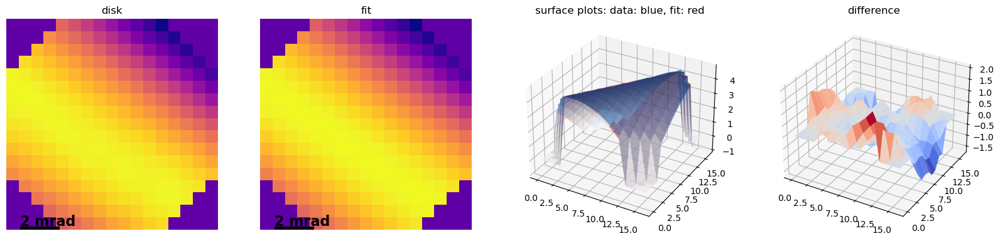

====== disk 2 ======
r² = 0.9989


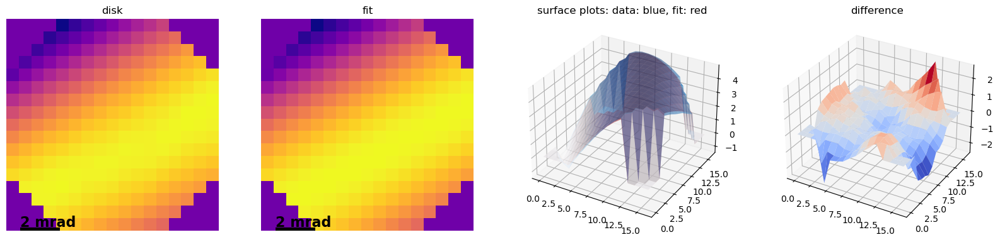

====== disk 3 ======
r² = 0.9989


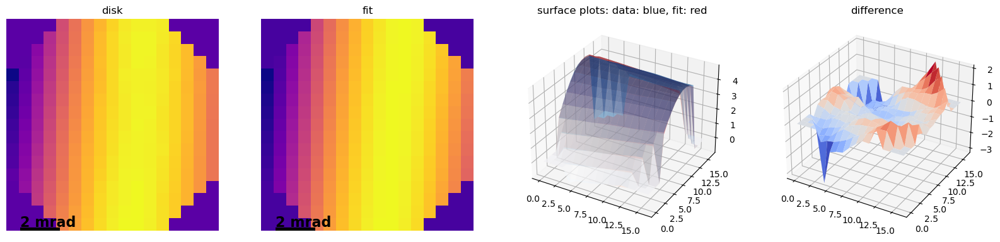

====== disk 4 ======
r² = 0.9987


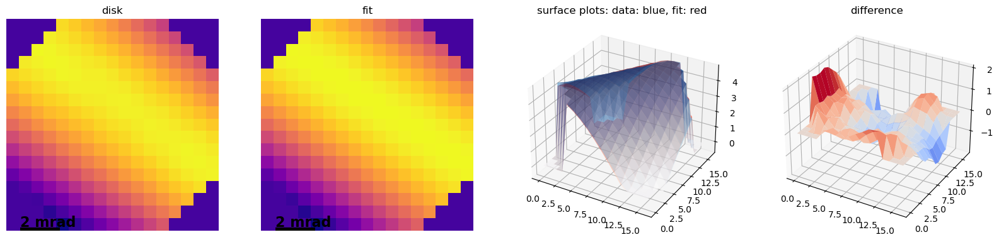

====== disk 5 ======
r² = 0.9985


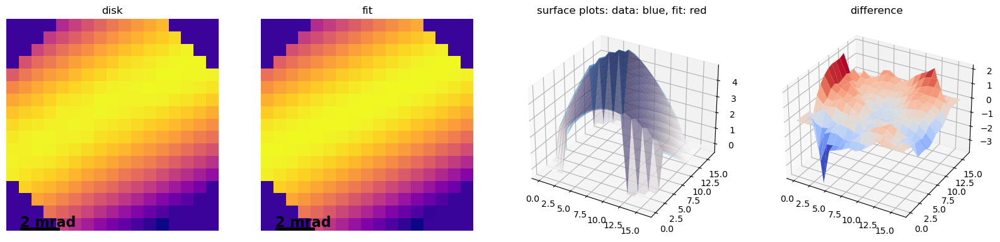

====== disk 0 ======
r² = 0.9976


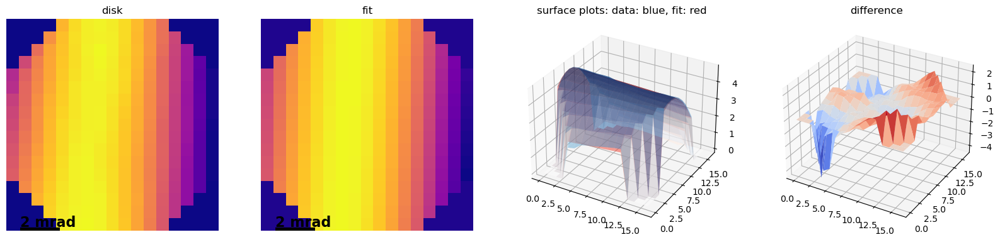

====== disk 1 ======
r² = 0.9991


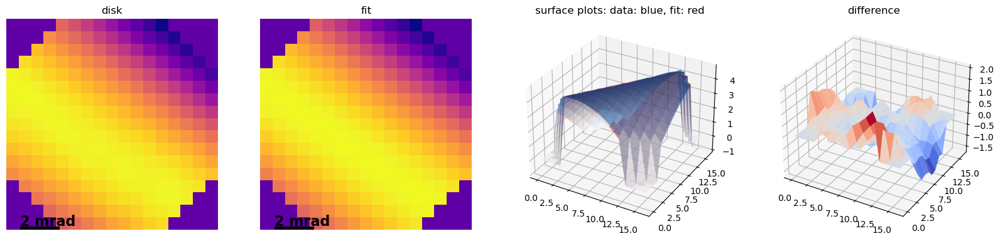

====== disk 2 ======
r² = 0.9989


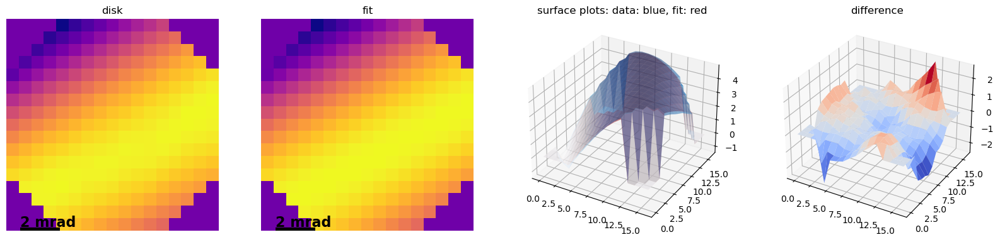

====== disk 3 ======
r² = 0.9989


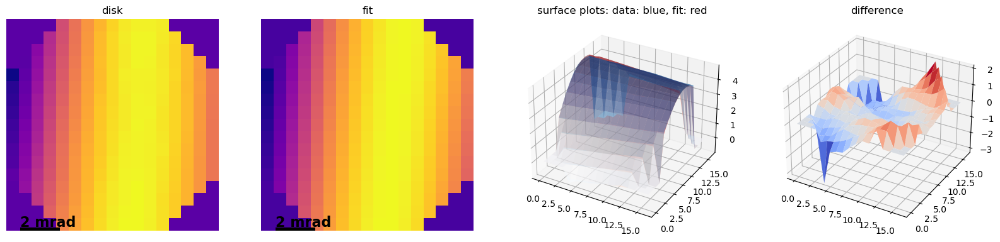

====== disk 4 ======
r² = 0.9987


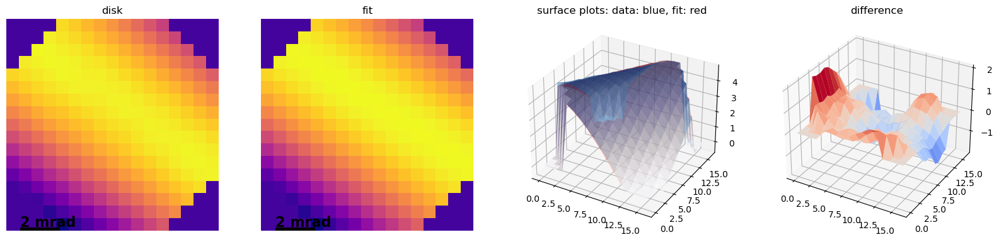

====== disk 5 ======
r² = 0.9985


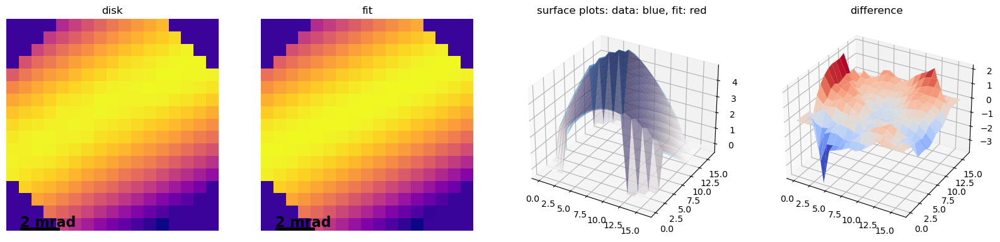

                 disk 0       disk 1       disk 2       disk 3       disk 4       disk 5
----------  -----------  -----------  -----------  -----------  -----------  -----------
position 0  8.93316e-08  9.09931e-08  9.05022e-08  9.1137e-08   9.0596e-08   9.04246e-08
position 1  8.93316e-08  9.09931e-08  9.05022e-08  9.1137e-08   9.0596e-08   9.04246e-08
position 2  9.1611e-08   9.00356e-08  9.07402e-08  9.09404e-08  9.03552e-08  9.04479e-08
position 3  9.1611e-08   9.00356e-08  9.07402e-08  9.09404e-08  9.03552e-08  9.04479e-08
                 disk 0       disk 1       disk 2       disk 3       disk 4       disk 5
----------  -----------  -----------  -----------  -----------  -----------  -----------
position 0  3.40472e-10  1.9795e-10   4.29069e-10  1.73401e-10  3.78502e-10  2.68338e-10
position 1  3.40472e-10  1.9795e-10   4.29069e-10  1.73401e-10  3.78502e-10  2.68338e-10
position 2  2.8437e-10   4.0965e-10   1.83539e-10  4.46398e-10  2.36098e-10  3.63028e-10
position 3  2.8437e-1

In [415]:
all_defocus, all_ild, all_rotation, all_errors, mean_ild, std_ild, mean_def, std_def,mean_nu, all_ild_errors = fit_and_mean(AB_spots,save='simulation_files/sim01-final/analysis/AB_regions/')

In [26]:
import skimage
from dask import array

In [42]:
def mean_then_fit(centers):
    
    relation = sim01.binned_data.shape[0]/sim01.real_image.shape[0]

    #fig, axs = hf.make_scalebar(sim01.virtual_image_binned.data, sim01.image_scale/relation, (1,1,1), unit='nm')

    #axs.imshow(skimage.filters.gaussian(sim01.virtual_image_binned.data, sigma=1).transpose(), cmap='plasma')

    #for c in centers:
     #   axs.plot(c[0], c[1], 'r.')
    
    patterns = []

    patterns = [sim01.binned_data[c[0], c[1]] for c in centers]    
    
    stack = array.stack(patterns)
    pattern = array.mean(stack, axis=0).compute()
    
    pattern = pattern - sim01.dp_mean
    
    fig, axs = hf.make_scalebar(pattern, sim01.scale, (1,1,1), unit='mrad')
    axs.imshow(hf.mask(pattern, 16).transpose(), cmap='plasma')
    
    plt.savefig('simulation_files/sim01-final/analysis/AA_regions/aa_mean.pdf')
    plt.show()
    
    
    dp = DP(pattern, disk_mask=sim01.disk_mask, 
                    gaussian=0, scale=sim01.scale, center=sim01.center,
                    orientation=sim01.orientation, radius=sim01.r_outer, verbose=False)
    dp.position_fitter(ps)
    
    return dp

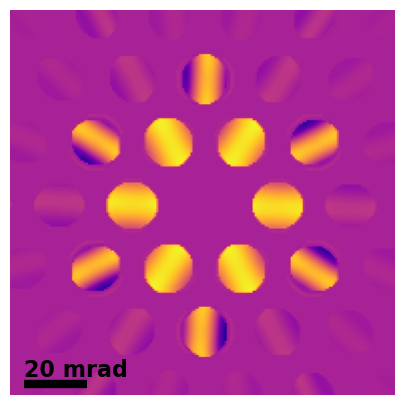

====== disk 0 ======
r² = 0.9982


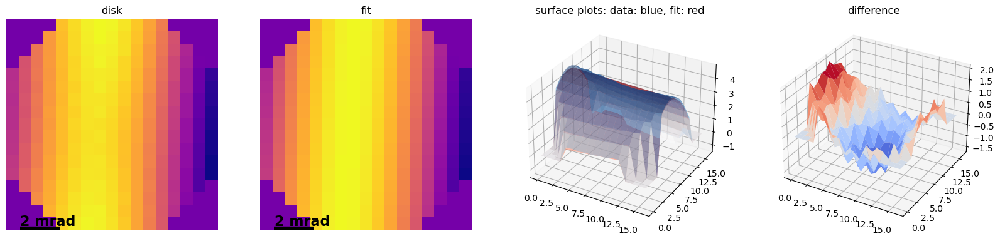

====== disk 1 ======
r² = 0.9989


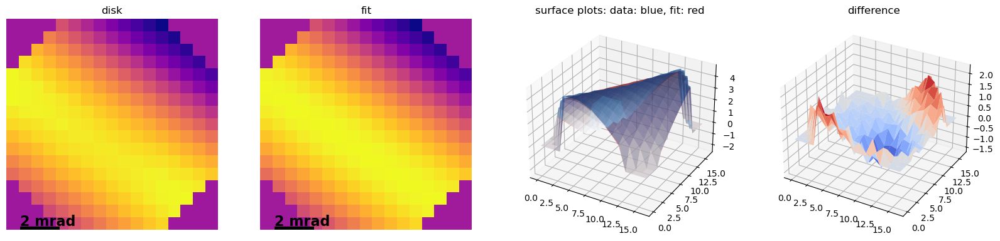

====== disk 2 ======
r² = 0.9989


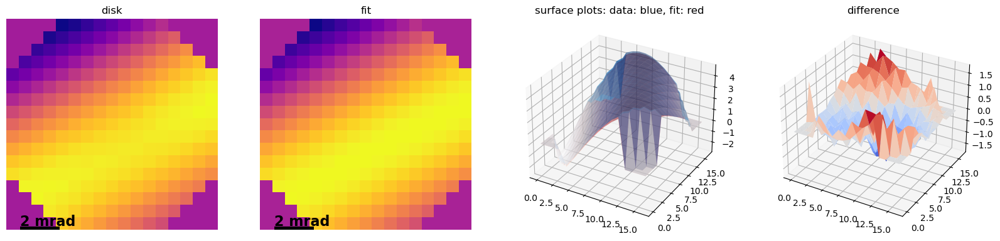

====== disk 3 ======
Reached the 10th iteration - I give up.
====== disk 4 ======
r² = 0.9987


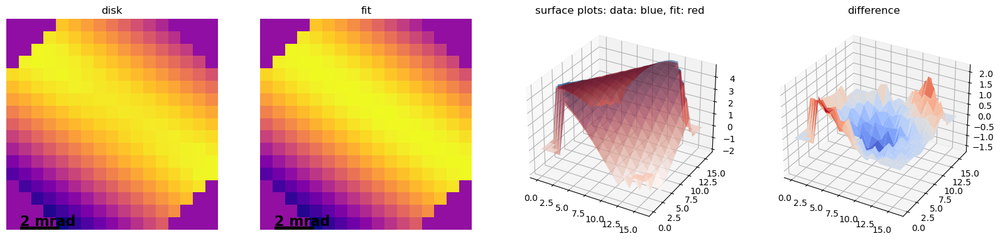

====== disk 5 ======
r² = 0.9987


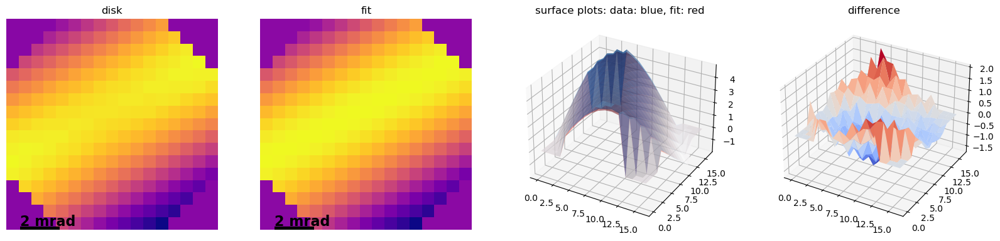

disk 0

A : -4.6652132557921893e-07
phi : 1.7463123182241576
nu : 0.0312513644472833
dir_angle : 1.5149034220506552
wl : 0.020208477460045036 rad
r_squared : 0.9982385510166647
dir_error : 0.0019209285780428013


disk 1

A : 4.665498762037179e-07
phi : 5.435799093427447
nu : -0.03124262806579011
dir_angle : 21.41091254372968
wl : -0.020214128360094664 rad
r_squared : 0.9988636166216396
dir_error : 0.0016771988434946049


disk 2

A : 4.6687528637100865e-07
phi : 2.562864832119333
nu : 0.031213465243670968
dir_angle : 3.6150855321722912
wl : 0.02023301447302884 rad
r_squared : 0.9989429384521409
dir_error : 0.0016252778381793517


disk 4

A : -4.669872338440572e-07
phi : -3.3088204473092064
nu : 0.031212817128636116
dir_angle : -0.5775245380043741
wl : 0.020233434599184908 rad
r_squared : 0.998694253451172
dir_error : 0.001763607261212969


disk 5

A : 4.671899566922159e-07
phi : -1.8759636204134718
nu : 0.031149259848737676
dir_angle : 0.4732057688332548
wl : 0.020274719113564127 rad
r_

In [97]:
dp_AA = mean_then_fit(AA_spots)
dp_AA.get_stats()#save='simulation_files/sim01-final/analysis/AA_regions/')
#sim01.analyze_disks(dp_AA.disks)

In [104]:
[d.success for d in dp_AA.disks]

[True, True, True, False, True, True]

In [123]:
ild = [ia.get_ild(ia.get_rotation(d.vector, d.dir_angle, sim01.orientation), d.nu) for d in dp_AA.disks if d.success==True ]

In [125]:
np.mean(ild)

3.2436903233927304e-10

In [126]:
np.std(ild)

1.6772843917596175e-11

In [112]:
err = [ia.get_ild_error(ia.get_ild(ia.get_rotation(d.vector, d.dir_angle, sim01.orientation), d.nu), d.nu, d.errors[-1], d.errors[-2]) for d in dp_AA.disks if d.success==True]

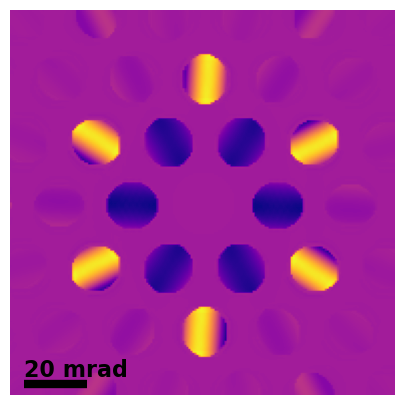

====== disk 0 ======
r² = 0.9998


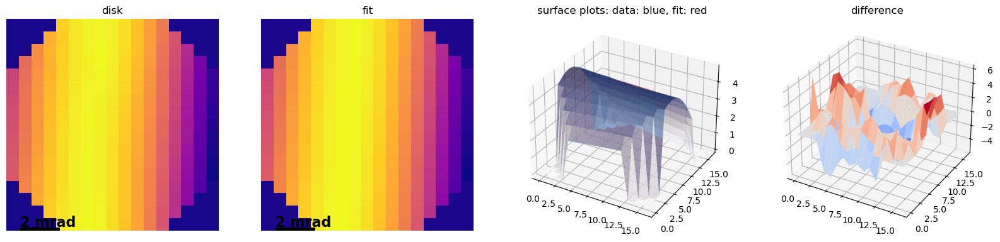

====== disk 1 ======
r² = 0.9998


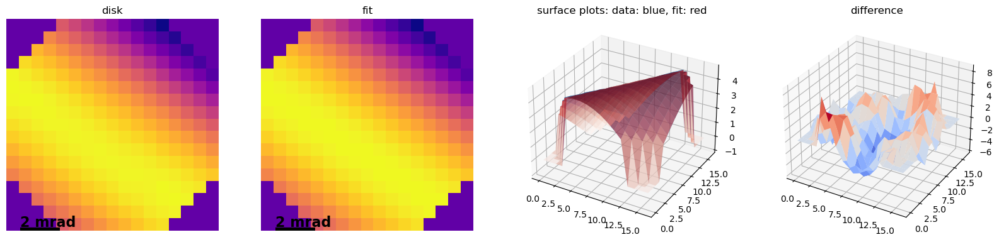

====== disk 2 ======
r² = 0.9998


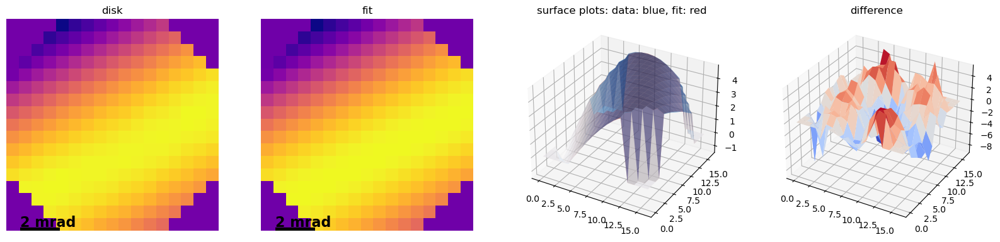

====== disk 3 ======
r² = 0.9998


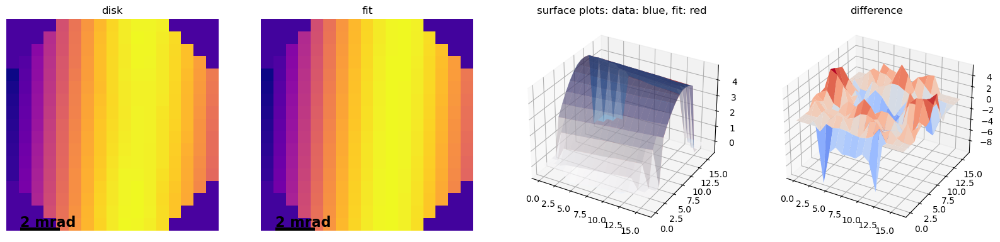

====== disk 4 ======
Reached the 10th iteration - I give up.
====== disk 5 ======
r² = 0.9998


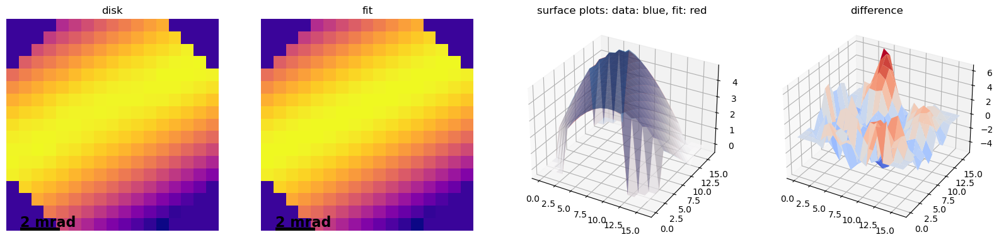

disk 0

A : 4.794820426529091e-07
phi : -5.192602663790924
nu : -0.0255397962136289
dir_angle : 1.5083198045075308
wl : -0.02472778125346062 rad
r_squared : 0.9998481372142086
dir_error : 0.0006988438571273584


disk 1

A : 4.783953007329172e-07
phi : 7.007605776090817
nu : -0.02554847175814611
dir_angle : -0.5845795591841547
wl : -0.02471938439242302 rad
r_squared : 0.9998438241663373
dir_error : 0.0007432548669350695


disk 2

A : 4.791191428640925e-07
phi : 4.151231746505475
nu : 0.025577762894432095
dir_angle : 0.4620495476362202
wl : 0.024691076253821043 rad
r_squared : 0.999841169278293
dir_error : 0.0007403889086575317


disk 3

A : -4.78817876770807e-07
phi : 1.4161352754402088
nu : 0.02569596181433302
dir_angle : 1.5088257128245426
wl : 0.02457749970955777 rad
r_squared : 0.9998319859760972
dir_error : 0.0007343008460960492


disk 5

A : 4.789623922339806e-07
phi : -1.4937897076402435
nu : 0.025528372284343872
dir_angle : 0.4600307629434985
wl : 0.024738846918802255 rad
r_squa

In [114]:
dp_AB = mean_then_fit(AB_spots)
dp_AB.get_stats()#save='simulation_files/sim01-final/analysis/AB_regions/')
#sim01.analyze_disks(dp_AA.disks)

In [115]:
ild = [ia.get_ild(ia.get_rotation(d.vector, d.dir_angle, sim01.orientation), d.nu) for d in dp_AB.disks if d.success==True ]

In [116]:
err = [ia.get_ild_error(ia.get_ild(ia.get_rotation(d.vector, d.dir_angle, sim01.orientation), d.nu), d.nu, d.errors[-1], d.errors[-2]) for d in dp_AB.disks if d.success==True]

In [119]:
np.mean(ild)

3.0913697008279424e-10

In [122]:
np.std(ild)

4.236342782975271e-12